# Ring Dynamics: Visualizing the Roche limit, Identifying Resonances, and Analyzing Shepherd Moons

## Visualizing the Roche limit 

First, let's visualize the Roche limit using an N-body simulation with the rebound package. 

An N-body simulation is a simulation of many particles under the influence of gravity and other physical laws. We will use the rebound package to simulate what happens to a loosely held together mass of particles (which we will call a "moon" as it approaches Saturn and breaks up.

In [1]:
# Importing the required libraries/modules

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
from matplotlib.patches import Circle
import rebound
from IPython.display import Image

In [2]:
# Starting the simulation

sim = rebound.Simulation()        # sets up the simulation
sim.units = ('km', 's', 'kg')     # sets up the units for the sim
sim.dt = 10                       # sets the time step - this is in seconds, which was defined in the line above
sim.softening = 0.2               # smoothes out numerical artifacts at small scales
sim.gravity    = "basic"          # sets the gravity module

Let's start by adding Saturn. This code searches NASA's Horizons database for the current location of Saturn and then moves the center of mass of the system to the center of mass of Saturn. 

In [3]:
sim.add("699")       # adds Saturn using its code 699
sim.move_to_com()    # moves to the new center of mass
sim.status()         # prints the status of the simulation

Searching NASA Horizons for '699'... 
Found: Saturn (699) 
---------------------------------
REBOUND version:     	3.19.9
REBOUND built on:    	Aug 21 2022 23:15:06
Number of particles: 	1
Selected integrator: 	ias15
Simulation time:     	0.0000000000000000e+00
Current timestep:    	10.000000
---------------------------------
<rebound.particle.Particle object at 0x7f901b0ad4c0, m=5.683361026390224e+26 x=0.0 y=0.0 z=0.0 vx=0.0 vy=8.881784197001252e-16 vz=0.0>
---------------------------------


The ```sim.status()``` call shows the current timestep and the current time of the simulation along with the position of the particles in our simulation. 

Next, we need to add our loosely bound mass of particles which will represent our moon that gets too close to Saturn and breaks up

In [4]:
# picks a random radius for a particle based on a power law

def powerlaw(slope, min_v, max_v):
    y = np.random.uniform()
    pow_max = pow(max_v, slope+1.)
    pow_min = pow(min_v, slope+1.)
    return pow((pow_max-pow_min)*y + pow_min, 1./(slope+1.))

particle_density = .1 # kg/m^3

print('Adding ring particles')
count = 0

# this while loop will add 100 particles to make our moon

while count < 100:
    radius = powerlaw(slope=-4, min_v=1, max_v=4)/1000  # meters, gets the radius
    
    # calculates the mass from the radius and the particle_density
    # assumes the particle is a sphere
    
    mass = particle_density*(4/3)*np.pi*(radius**3)  # kg
    
    rs = 180000 # the particles will be 180,000 km away from the center of Saturn
    
    theta = np.pi/4
    
    # converts from polar coords to cartesian
    
    x = rs*np.cos(theta)
    y = rs*np.sin(theta)
    
    # uses np.random.uniform() to add a number between -5000 and +5000 to the x and y coords
    # this will spread the particles out so they're not all on top of each other
    
    x += np.random.uniform(low=-1,high=1)*5000
    y += np.random.uniform(low=-1,high=1)*5000
    
    # lastly, we use v = sqrt(GM/r) to calculate the speed of the particle
    # G = 6.67428e-11, M is the mass of Saturn (stored in the simulation as sim.particles[0].m)
    # r is the distance rs but in m not km, the final velocity is in km/s
    # and is then multiplied by .75 to ensure that the moon is falling towards Saturn

    v = 0.75*np.sqrt(6.67428e-11*sim.particles[0].m/rs/1000)/1000 # km/s
    
    # the sim.add() call adds this new particle
    
    sim.add(
        m=mass,
        r=radius,
        x=x,
        y=y,
        z=np.random.normal(),
        vx = -v*np.sin(theta),
        vy = v*np.cos(theta),
        vz = 0.)
    count += 1
    
print('Finished adding ring particles')

Adding ring particles
Finished adding ring particles


To visualize the system after each integration or jump forward in time, I have defined a plotting function below which will generate images in a 'myimages' folder (which you will need to create before running the code).

In [5]:
# funtion that creates images of the simulation after each time jump
# the images are stored in a separate folder

def plotParticles(sim, k):
    '''
    Takes an input simulation and integration number k
    Outputs a png of the current system with Saturn scaled to real size but particles enlarged
    '''
    
    # Setting up the basic parameters of the image
    
    fig = plt.figure(figsize=(8,8))
    ax = plt.subplot(111, aspect='equal')
    ax.set_ylabel("y / km")
    ax.set_xlabel("x / km")
    ax.set_xlim(-200000, 200000)
    ax.set_ylim(-200000, 200000)
    ax.set_aspect('equal')
    ax.ticklabel_format(axis="both", style="sci", scilimits=(0,0))
    
    # Iterates through each particle
    # i is the index of the particle, while p contains all the attributes of the particle
    # such as x and y coords
    
    for i, p in enumerate(sim.particles):
        if i == 0:
            fc, ec, a, r = "goldenrod", "None", 1, 58232
        else:
            fc, ec, a, r = "lightgray", "k", 1, p.r*5000
        circ = Circle((p.x, p.y), r, facecolor=fc, edgecolor=ec, alpha=a)
        ax.add_patch(circ)
    plt.savefig('./myimages/dynamics_'+str(k)+'.png', dpi=100)
    fig.clf()
    plt.close()

The next code block will integrate forward 500 times (jumping 100 s each time) and output an image after each jump.

In [7]:
# Integrates each time jump and creates the final image
# Takes a bit of time to run

plotParticles(sim, 0)                 # plots the initial setup
for i in range(500):                  # jumps 500 times
    sim.integrate(sim.t + 100)        # this gets the current sim time (sim.t) and jumps an extra 100 s
    plotParticles(sim, i+1)           # plots again

sim.save("./myimages/myfirstsim.bin") # this will save the last state of the particles in the sim

Using all these images, I created a gif (using ezgif) to show the entire simulation. 

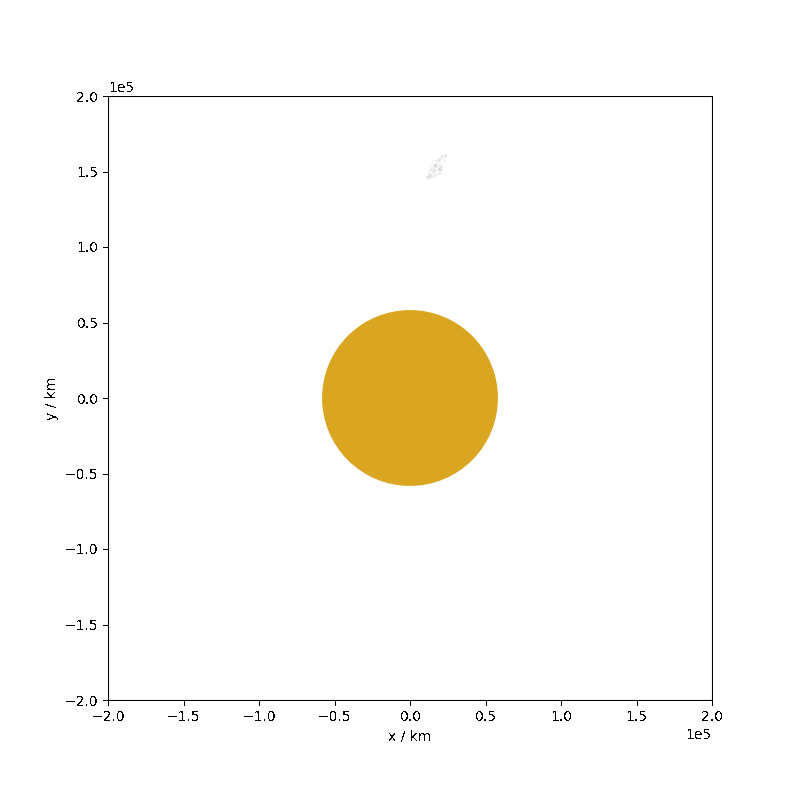

In [9]:
Image('/figures/roche_Limit.gif')

The moon disintegrates! The side of the moon closest to Saturn experiences a stronger gravitational pull and also has to travel faster to maintain its orbit so the particles get spread out in a band. 

# Resonances

We will now look at mean-motion resonances using data on about moons of Saturn.

A resonance occurs when the orbital period of one particle is an integer multiple of another particle's orbital period. For example, a 2:1 resonance means that the inner particle (the one closer to the parent body) orbits twice in the time the outer particle orbits only once. This is an example of a first order resonance. The first order resonances are 2:1, 3:2, 4:3, 5:4, 6:5 and so on. 

When two objects are in resonance they 'tug' on each other at certain points around their orbits. These small gravitational tugs build up to a point where they can significantly change each other's orbits. Resonances can either stabilize the orbits of the objects (making it harder for them to change their orbit) or destabilize the orbits of one or both of the objects.

In this section we'll first look at the moons to see if any are in resonant orbits with each other. Then we'll determine locations in the rings where the ring particles are resonant with certain moons and link these resonances to ring features.

In [10]:
# Loads a csv that contains data about Saturn's moons

saturn_moons = pd.read_csv('/data/saturn_moons.csv')
saturn_moons.head()

,Name,Semimajor Axis,Period,Eccentricity,Inclination,Mean Diameter,Mass,Associated Ring,Footnotes,Comments
0,Pan,133584.0,0.575,0.00001,0.0001,28.0,495.0,"A ring, Encke gap","4,8,9",NaN
1,Daphnis,136504.0,0.594,0.00003,0.0036,7.6,7.7,"A ring, Keeler gap","3,10",NaN
2,Atlas,137666.0,0.602,0.00120,0.0030,30.2,660.0,"A ring, Roche division","8,9",NaN
3,Prometheus,139378.0,0.613,0.00220,0.0070,84.2,15900.0,"F ring, Roche division","8,9",Prometheus and Pandora interact to produce cha...
4,Pandora,141713.0,0.629,0.00420,0.0500,81.4,13700.0,F ring,"8,9",Prometheus and Pandora interact to produce cha...


For now we are only really interested in the moon's Name and Period. To calculate whether two moons are in resonant orbits with each other, we need to take one moon's period and divide it by another moon's period. If we get any ratio of integers there is a resonance between their orbits. For instance, if after dividing two orbital periods we get 1.5 (or close), the two moons are in a 3:2 resonance. The code block below creates a new dataframe with the moon names as both the rows and columns, and the ratio of periods as the data values.

In [11]:
# Stores the names of each Moon

moon_names = saturn_moons['Name']

# Creates an empty data frame

moon_res = pd.DataFrame({}, columns=moon_names)

# loops through each name

for i in moon_names:
    
    # gets the period for the moon, i, from the first dataframe
    
    this_moon_period = saturn_moons.loc[saturn_moons['Name']==i,'Period'].values[0]
    
    res = []
    
    # loops through moon names again
    
    for j in moon_names:
        
        # gets the period for the moon with name j from the first dataframe and divides it by this_moon_period
        # then appends the ratio ro res
        
        second_moon_period = saturn_moons.loc[saturn_moons['Name']==j,'Period'].values[0]
        
        period_ratio = second_moon_period/this_moon_period
        
        res.append(period_ratio)
        
    # these two lines add this new row to our empty df which we called moon_res
    # thus allowing us to see all the ratios of periods between each pair of Moons
    
    this_row = pd.DataFrame([res], index=[i], columns=moon_names)
    moon_res = pd.concat([moon_res, this_row])

moon_res

Name,Pan,Daphnis,Atlas,Prometheus,Pandora,Epimetheus,Janus,Aegaeon,Mimas,Methone,...,Telesto,Calypso,Dione,Helene,Polydeuces,Rhea,Titan,Hyperion,Iapetus,Phoebe
Pan,1.0,1.033043,1.046957,1.066087,1.093913,1.208696,1.208696,1.405217,1.638261,1.756522,...,3.283478,3.283478,4.76,4.76,4.76,7.857391,27.73913,37.008696,137.965217,953.078261
Daphnis,0.968013,1.0,1.013468,1.031987,1.058923,1.170034,1.170034,1.360269,1.585859,1.700337,...,3.178451,3.178451,4.607744,4.607744,4.607744,7.606061,26.851852,35.824916,133.552189,922.592593
Atlas,0.95515,0.986711,1.0,1.018272,1.04485,1.154485,1.154485,1.342193,1.564784,1.677741,...,3.136213,3.136213,4.546512,4.546512,4.546512,7.504983,26.495017,35.348837,131.777409,910.332226
Prometheus,0.93801,0.969005,0.982055,1.0,1.026101,1.133768,1.133768,1.318108,1.536705,1.647635,...,3.079935,3.079935,4.464927,4.464927,4.464927,7.37031,26.019576,34.714519,129.412724,893.996737
Pandora,0.914149,0.944356,0.957075,0.974563,1.0,1.104928,1.104928,1.284579,1.497615,1.605723,...,3.00159,3.00159,4.351351,4.351351,4.351351,7.18283,25.357711,33.831479,126.120827,871.255962
Epimetheus,0.827338,0.854676,0.866187,0.882014,0.905036,1.0,1.0,1.16259,1.355396,1.453237,...,2.716547,2.716547,3.938129,3.938129,3.938129,6.500719,22.94964,30.618705,114.143885,788.517986
Janus,0.827338,0.854676,0.866187,0.882014,0.905036,1.0,1.0,1.16259,1.355396,1.453237,...,2.716547,2.716547,3.938129,3.938129,3.938129,6.500719,22.94964,30.618705,114.143885,788.517986
Aegaeon,0.711634,0.735149,0.74505,0.758663,0.778465,0.860149,0.860149,1.0,1.165842,1.25,...,2.336634,2.336634,3.387376,3.387376,3.387376,5.591584,19.740099,26.336634,98.180693,678.242574
Mimas,0.610403,0.630573,0.639066,0.650743,0.667728,0.737792,0.737792,0.857749,1.0,1.072187,...,2.004246,2.004246,2.90552,2.90552,2.90552,4.796178,16.932059,22.590234,84.214437,581.762208
Methone,0.569307,0.588119,0.59604,0.606931,0.622772,0.688119,0.688119,0.8,0.932673,1.0,...,1.869307,1.869307,2.709901,2.709901,2.709901,4.473267,15.792079,21.069307,78.544554,542.594059


Now we have a table with period ratios! We only need to look at the numbers above the diagonal (which are all ones). 

Let's now look at resonances between moons and ring particles, starting with the moon Mimas . We need to get Mimas' Period and Semimajor Axis from our first dataframe. We will divide Mimas's period by an integer (2 for the 2:1 resonance) and then use Kepler's 3rd law:

$$A^3 = kT^2 $$

to find the Semimajor Axis ($A$) of the resonant ring particle with period $T$. Here $k$ is a constant that we will have to calculate. The code block below to calculatse the location of the 2:1 resonance with Mimas.

In [12]:
# locates the radius and period of Mimas from the dataframe saturn_moons

mimas_radius = saturn_moons.loc[saturn_moons['Name'] == 'Mimas', 'Semimajor Axis'].values[0]
mimas_period = saturn_moons.loc[saturn_moons['Name'] == 'Mimas', 'Period'].values[0]

print('Mimas a = {:6.0f} km'.format(mimas_radius))
print('Mimas T = {:6.2f} days'.format(mimas_period))

# calculates the constant using Kepler's 3rd law (rearranging to get k)

const = (mimas_radius**3)/(mimas_period**2) # km^3 / days^2

# divides the period by 2 to get mimas_2_1_period
# then uses Kepler's 3rd law to get A (mimas_2_1_radius)

mimas_2_1_period = mimas_period/2
mimas_2_1_radius = np.cbrt(const*mimas_2_1_period**2)
print('Mimas 2:1 res a = {:6.0f} km'.format(mimas_2_1_radius))
print('Mimas 2:1 res T = {:6.2f} days'.format(mimas_2_1_period))

Mimas a = 185537 km
Mimas T =   0.94 days
Mimas 2:1 res a = 116881 km
Mimas 2:1 res T =   0.47 days


Using the reference image below, we can see that the Cassini Division is the feature at this resonance!

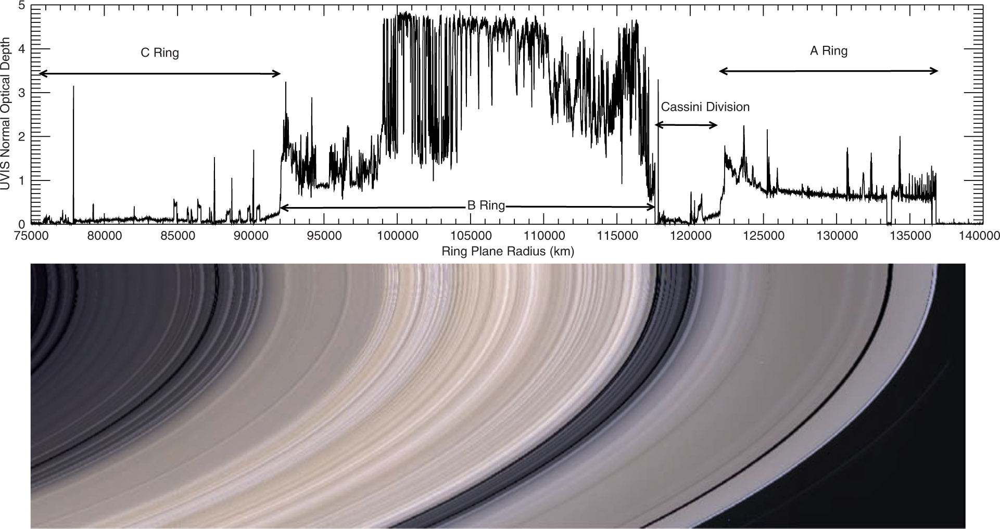

In [13]:
Image('/figures/Ring_overview.jpeg')

Next, the code block below calculates the resonances with the large moon Janus and then identifies ring features at these resonant positions (if there are any). 

The last part of the code block may be confusing. Here is an example to clarify why it works: Consider a hypothetical 5:3 resonance between a particle and a moon. This means that the the orbital period of the particle is $ \frac{5}{3} $ times that of the moon. Therefore, to obtain the particle's period, the moon's period must first be divided by 5 (which is represented by the values in the list res_no). Then, it must be multiplied by 3, which is equal to 5-2, where 2 is obtained because it is the order of the resonance. In the code below, this is represented by multiplying by (res_no - order). Note that the order could be greater than the res_no and this would lead to a negative period and ratio, implying that the resonance does not exist). 

In [17]:
def locate_res(moon_name, order):
    '''
    Takes the name of a moon of saturn as a string and returns the resonant periods and locations
    '''
    # gets the radius and period of the moon with name moon_name

    moon_radius = saturn_moons.loc[saturn_moons['Name'] == moon_name, 'Semimajor Axis'].values[0]
    moon_period = saturn_moons.loc[saturn_moons['Name'] == moon_name, 'Period'].values[0]
    print(moon_name+' a = {:6.0f} km'.format(moon_radius))
    print(moon_name+' T = {:6.2f} days'.format(moon_period))
    
    # calculates the constant k

    this_const = (moon_radius**3)/(moon_period**2) # km^3 / days^2
    res_no = [2, 3, 4, 5, 6, 7]
    
    # loops over each number in res_no
    # calculates the period and radius of the particle
    # first divides the moon_period by the number in res_no then times by the number minus the order
    # this makes it possible to calculate second and higher order resonances
    # this works, as shown by the following example above. 

    for i in res_no:
        this_res_period = moon_period*(i-order)/i
        this_res_radius = np.cbrt(this_const*this_res_period**2)
        print(moon_name+' '+str(i)+':'+str(i-order)+' a = {:6.0f} km'.format(this_res_radius))
        print(moon_name+' '+str(i)+':'+str(i-order)+' T = {:6.2f} days'.format(this_res_period))

# This will print the first order resonances with the moon Janus
locate_res('Janus', 1)

Janus a = 151452 km
Janus T =   0.69 days
Janus 2:1 a =  95409 km
Janus 2:1 T =   0.35 days
Janus 3:2 a = 115580 km
Janus 3:2 T =   0.46 days
Janus 4:3 a = 125021 km
Janus 4:3 T =   0.52 days
Janus 5:4 a = 130517 km
Janus 5:4 T =   0.56 days
Janus 6:5 a = 134118 km
Janus 6:5 T =   0.58 days
Janus 7:6 a = 136661 km
Janus 7:6 T =   0.60 days


The image below and the one above can be used to locate ring features at the resonant positions with Janus.

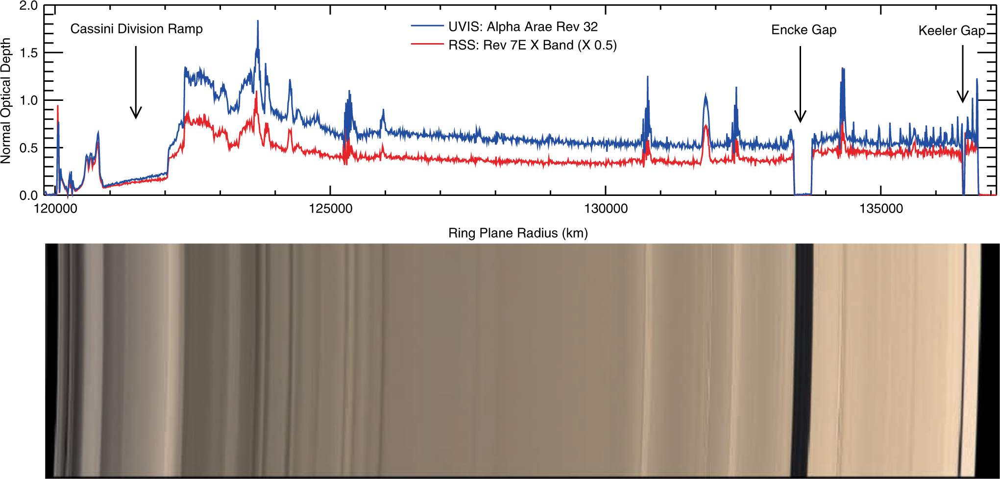

In [16]:
Image('/figures/Aring_overview.jpeg')

## Waves <a class="anchor" id="Waves"></a>

The next image was located using the [OPUS](http://pds-rings.seti.org/search/ ) search tool on the rings and moons node of the planetary data system. It covers a range of 131,500 km to 132,500 km in semimajor axis and was taken by the Cassini spacecraft

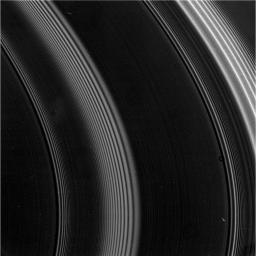

In [14]:
Image('/figures/N1467351539_2.jpeg')

The inner wave on the far left is a bending wave. Bending waves move inwards (towards Saturn) and are produced by moons which are inclined relative to Saturn's equator and the plane of Saturn's rings. Bending waves create vertical ripples in rings. The larger wave to the right of the bending wave (just left of center at the bottom) is a density wave which moves outwards. Density waves are more common than bending waves. To the right of the image you can see another pair of bending and density waves!

One of the larger inner moons causes the bending and density waves between 131,500 km and 132,500 km. The code block below and the function above can be used to calculate the resonances for guesses of the moon:

In [19]:
# We can see that a 5:3 resonance with Mimas is causing the bending and density waves

locate_res('Mimas', 2)

Mimas a = 185537 km
Mimas T =   0.94 days
Mimas 2:0 a =      0 km
Mimas 2:0 T =   0.00 days
Mimas 3:1 a =  89197 km
Mimas 3:1 T =   0.31 days
Mimas 4:2 a = 116881 km
Mimas 4:2 T =   0.47 days
Mimas 5:3 a = 131987 km
Mimas 5:3 T =   0.57 days
Mimas 6:4 a = 141591 km
Mimas 6:4 T =   0.63 days
Mimas 7:5 a = 148256 km
Mimas 7:5 T =   0.67 days


## Shepherd Moons 

Shepherd moons are moons that lie in gaps in Saturn's rings. Their gravitational pull on the ring particles clears out the area around them. In the following image, we can see the moon Daphnis in the Keeler gap:

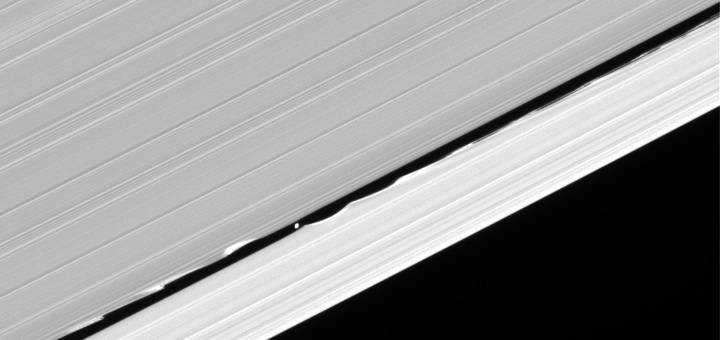

In [20]:
Image('/figures/daphnis1.jpeg')

The moon's gravity clears out the material from the gap. Notice how it is also creating ripples in the edges of the gap. This pattern forms from the combined attraction from the moon and Saturn. The ripple along the inner edge (at the top) are leading Daphnis, i.e. they are ahead of Daphnis in their orbit because they are travelling at a higher speed. The ripple along the outer edge trails Daphnis. These ripples are prominent because the gap is quite small and Daphnis is close to the edges. The Encke gap in which the moon Pan resides does not have ripples like this since the gap is much wider and there is a larger distance between Pan and the gap edges.

The gif below shows a simulation of the effect of a moon like Daphnis on a ring arc (a segment of a ring).

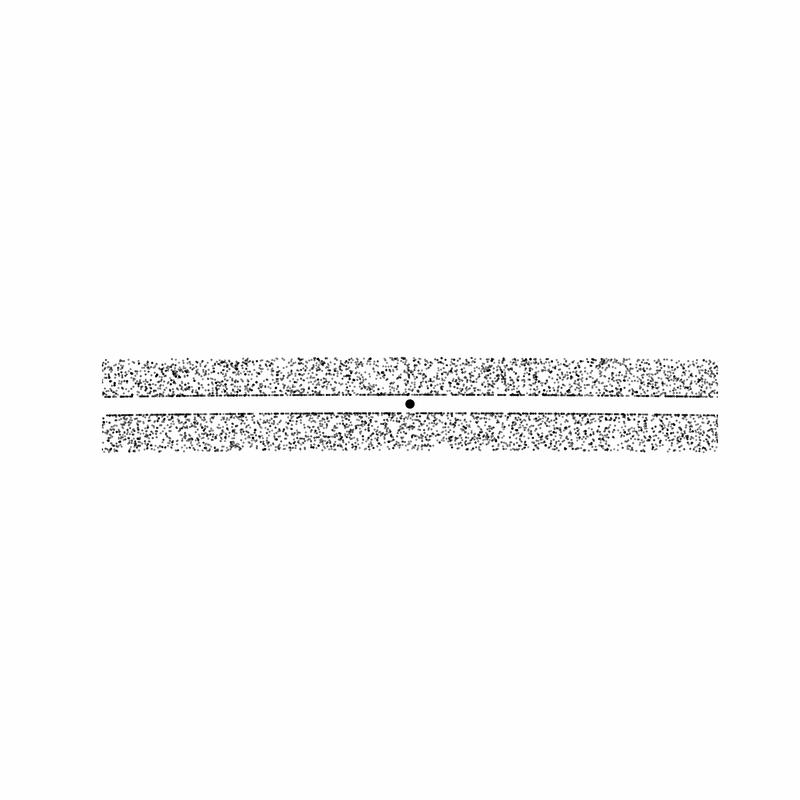

In [18]:
Image('/figures/shepherd.gif')

# References 

Phil Nicholson - Resonances and Rings [http://hosting.astro.cornell.edu/specialprograms/reu2012/workshops/rings/](http://hosting.astro.cornell.edu/specialprograms/reu2012/workshops/rings/)  
Outer Planets Data Search Tool (OPUS3) PDS Ring-Moons Node NASA/SETI [https://opus.pds-rings.seti.org/opus/](https://opus.pds-rings.seti.org/opus/)  
Rebound N-body simulator [https://rebound.readthedocs.io/en/latest/](https://rebound.readthedocs.io/en/latest/)  

Chris Mihos - Ring Dynamics [http://burro.astr.cwru.edu/Academics/Astr221/SolarSys/Rings/dynamics.html](http://burro.astr.cwru.edu/Academics/Astr221/SolarSys/Rings/dynamics.html)  
Matthew Hedman - Planetary Ring Dynamics [https://webpages.uidaho.edu/mhedman/papers_published/UNESCO_dynamics.pdf](https://webpages.uidaho.edu/mhedman/papers_published/UNESCO_dynamics.pdf)     
Shane Byrne - Rings and Moons of Saturn [http://www.lpl.arizona.edu/~shane/PTYS_206/lectures/PTYS_206_saturns_rings_moons.pdf](http://www.lpl.arizona.edu/~shane/PTYS_206/lectures/PTYS_206_saturns_rings_moons.pdf)  

Simulations:  
Cole Kendrick - Computer Simulation of Saturn's Rings [http://courses.physics.ucsd.edu/2018/Winter/physics141/Assignments/SaturnRingSimulation.pdf](http://courses.physics.ucsd.edu/2018/Winter/physics141/Assignments/SaturnRingSimulation.pdf)  
Kirsten Larson - The Effects of Moons on Saturn's Ring System [http://physics.wooster.edu/JrIS/Files/Larson_Web_article.pdf](http://physics.wooster.edu/JrIS/Files/Larson_Web_article.pdf) 